# Imports og config

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.stats import norm
from sklearn.preprocessing import MinMaxScaler  # Normalization
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import davies_bouldin_score
from minisom import MiniSom  # Self-Organizing Map
from mpl_toolkits.mplot3d import Axes3D
import skfuzzy as fuzz  # Fuzzy C-Means Clustering
from itertools import combinations
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score
from sklearn.feature_selection import mutual_info_classif
from sklearn.cluster import KMeans
import numpy as np
from sklearn.feature_selection import mutual_info_classif
from sklearn.cluster import KMeans
import numpy as np
from tabulate import tabulate

pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.expand_frame_repr', False)

N_CLUSTERS = 4

df = pd.read_csv(os.path.join('..', '..', 'data', 'Social-media', 'OnlineNewsPopularity.csv'))

# ✅ Preprocess

## ✅ EDA

### ✅ vise columns

In [65]:
import pandas as pd
import math
import re

# Assuming you have your DataFrame named 'df'
# If not, replace this line with your actual DataFrame
# df = pd.read_csv('your_data.csv')

column_names = df.columns.tolist()

def escape_latex(text):
    """Escape special characters for LaTeX."""
    escapes = {
        '_': '\\_',
        '%': '\\%',
        '&': '\\&',
        '#': '\\#',
        '$': '\\$',
        '{': '\\{',
        '}': '\\}',
        '~': '\\textasciitilde{}',
        '^': '\\textasciicircum{}',
        '\\': '\\textbackslash{}',
    }
    return ''.join(escapes.get(c, c) for c in text)

# Calculate the number of rows needed for 3 columns
num_rows = math.ceil(len(column_names) / 3)

# Generate LaTeX code
latex_code = "\\begin{multicols}{3}\n\\begin{itemize}\n"

for i, col in enumerate(column_names):
    escaped_col = escape_latex(col)
    latex_code += f"    \\item {escaped_col}\n"
    # Add column break if needed
    if (i + 1) % num_rows == 0 and i != len(column_names) - 1:
        latex_code += "\\end{itemize}\n\\columnbreak\n\\begin{itemize}\n"

latex_code += "\\end{itemize}\n\\end{multicols}"

print(latex_code)

\begin{multicols}{3}
\begin{itemize}
    \item url
    \item timedelta
    \item n\_tokens\_title
    \item n\_tokens\_content
    \item n\_unique\_tokens
    \item n\_non\_stop\_words
    \item n\_non\_stop\_unique\_tokens
    \item num\_hrefs
    \item num\_self\_hrefs
    \item num\_imgs
    \item num\_videos
    \item average\_token\_length
    \item num\_keywords
    \item data\_channel\_is\_lifestyle
    \item  data\_channel\_is\_entertainment
    \item data\_channel\_is\_bus
    \item data\_channel\_is\_socmed
    \item data\_channel\_is\_tech
    \item data\_channel\_is\_world
    \item kw\_min\_min
    \item kw\_max\_min
\end{itemize}
\columnbreak
\begin{itemize}
    \item kw\_avg\_min
    \item kw\_min\_max
    \item kw\_max\_max
    \item kw\_avg\_max
    \item kw\_min\_avg
    \item kw\_max\_avg
    \item kw\_avg\_avg
    \item self\_reference\_min\_shares
    \item self\_reference\_max\_shares
    \item self\_reference\_avg\_sharess
    \item weekday\_is\_monday
    \item 

### ✅ vise duplicates

In [66]:
duplicate_count = df.duplicated().sum()
duplicate_summary = pd.DataFrame({
    'Description': ['Total Duplicate Rows'],
    'Count': [duplicate_count]
})
latex_table = tabulate(duplicate_summary, headers='keys', tablefmt='latex', showindex=False)
print(latex_table)

\begin{tabular}{lr}
\hline
 Description          &   Count \\
\hline
 Total Duplicate Rows &       0 \\
\hline
\end{tabular}


### ✅ vise missing values

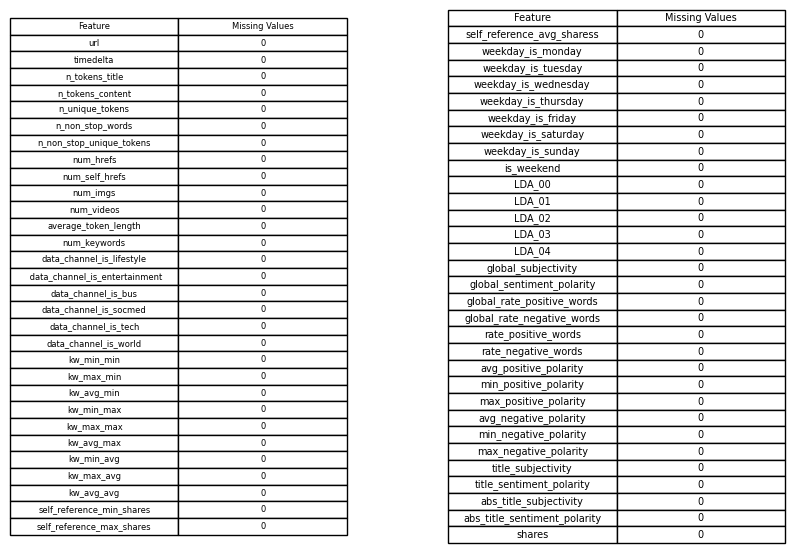

In [67]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame (use your actual DataFrame)
# df = pd.DataFrame({...})

# Calculate missing values
missing_values = df.isnull().sum()

# Create a DataFrame for displaying the missing values in table format
missing_df = pd.DataFrame({
    'Feature': missing_values.index,
    'Missing Values': missing_values.values
})

# Split the DataFrame into two halves
mid_index = len(missing_df) // 2
left_table = missing_df.iloc[:mid_index]
right_table = missing_df.iloc[mid_index:]

# Create a figure to display the two tables side by side
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 6))

# Plot the left table
axes[0].axis('off')
axes[0].table(cellText=left_table.values, colLabels=left_table.columns, cellLoc='center', loc='center')

# Plot the right table with a bit of space to the right
axes[1].axis('off')
axes[1].table(cellText=right_table.values, colLabels=right_table.columns, cellLoc='center', loc='center')

# Adjust spacing between the tables
plt.subplots_adjust(wspace=0.3)

# Display the plot
plt.show()


## ✅ Fjerne outliers og vise fordeling

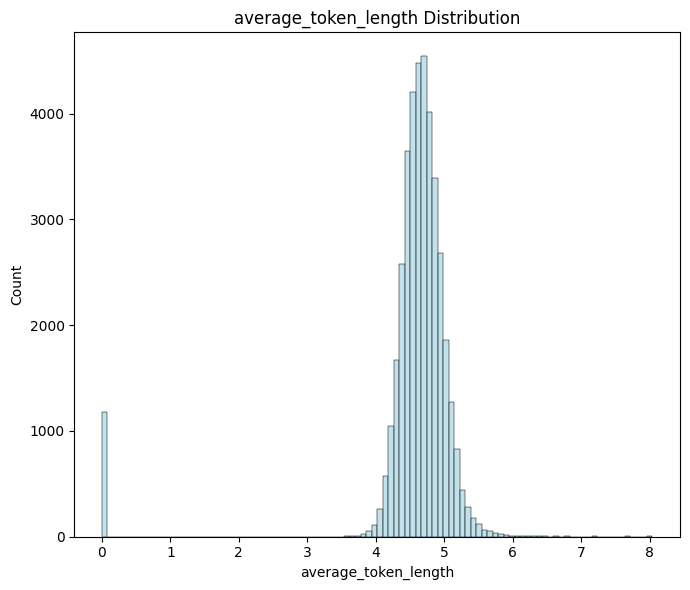

c:\IT3212\.venv\Lib\site-packages\scipy\stats\_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 39644.
  res = hypotest_fun_out(*samples, **kwds)


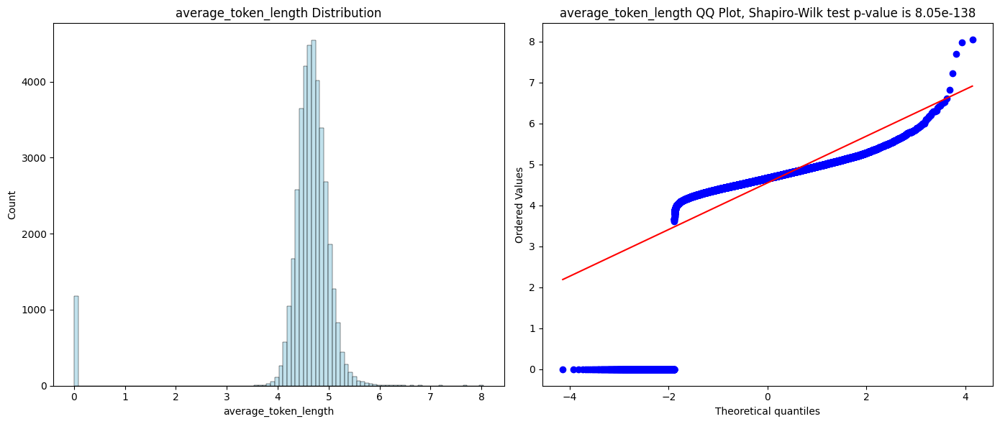

8.04711796066599e-138


C:\Users\ander\AppData\Local\Temp\ipykernel_22784\308483798.py:110: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


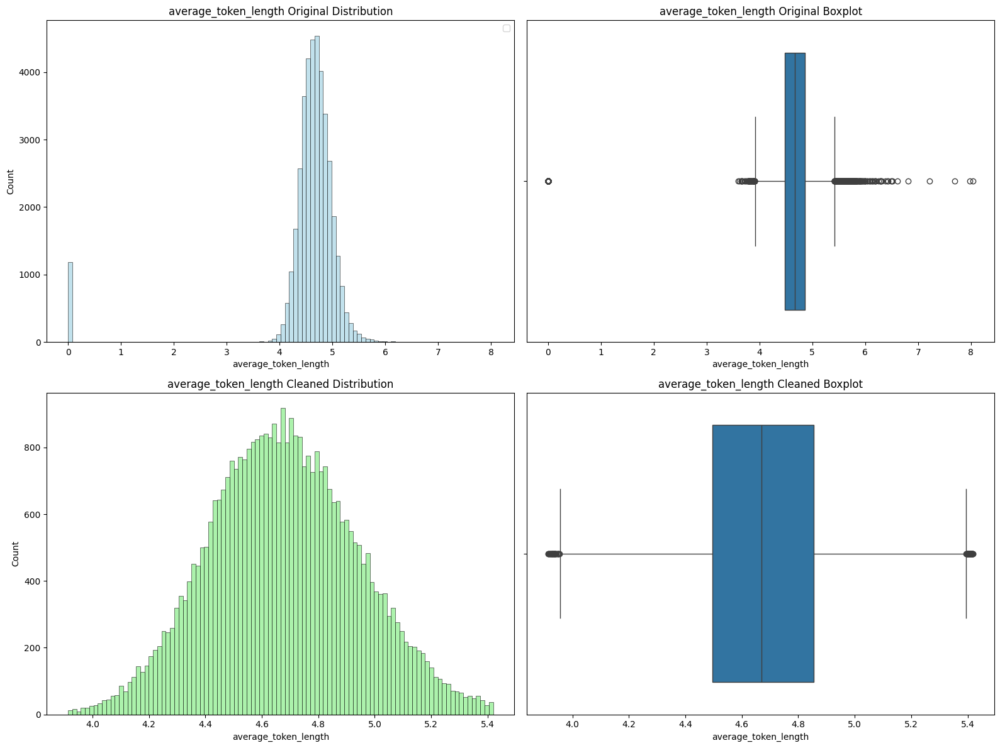

In [68]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

df = df.drop(columns=['url'], inplace=False)

# Function to check for normality using the Shapiro-Wilk test
def is_normal_distribution(data, alpha=0.05):
    stat, p_value = stats.shapiro(data)
    print(p_value)
    return p_value > 0.001  # If p-value > alpha, data is normal

# Function to plot distribution and QQ plot
def plot_distribution_qq(data, feature_name):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    sns.histplot(data, kde=False, ax=axes[0], color='lightblue', bins=100)
    axes[0].set_title(f'{feature_name} Distribution')
    stat, p_value = stats.shapiro(data)
    stats.probplot(data, dist="norm", plot=axes[1])
    axes[1].set_title(f'{feature_name} QQ Plot, Shapiro-Wilk test p-value is {p_value:.2e}')

    plt.tight_layout()
    plt.show()

# Function for z-score outlier removal
def remove_outliers_z(data, threshold=3):
    z_scores = np.abs(stats.zscore(data))
    return data[z_scores < threshold]

# Function for IQR outlier removal
def remove_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    return data[(data >= (Q1 - 1.5 * IQR)) & (data <= (Q3 + 1.5 * IQR))]

# List of features to skip
features_to_skip = [
    'data_channel_is_lifestyle', 
    'data_channel_is_entertainment',
    'data_channel_is_bus',
    'data_channel_is_socmed',
    'data_channel_is_tech',
    'data_channel_is_world',
    'weekday_is_monday',
    'weekday_is_tuesday',
    'weekday_is_wednesday',
    'weekday_is_thursday',
    'weekday_is_friday',
    'weekday_is_saturday',
    'weekday_is_sunday',
    'is_weekend'
]

# Main loop through each feature
for feature in df.columns:
    if feature != 'average_token_length': continue

    # print(f'Processing {feature}')
    if feature == 'average_token_length':
        fig, ax = plt.subplots(1, 1, figsize=(7, 6))  # Create a single subplot
        sns.histplot(df[feature], kde=False, ax=ax, color='lightblue', bins=100)  # Use ax instead of axes[0]
        ax.set_title(f'{feature} Distribution')

        plt.tight_layout()
        plt.show()

        # Plot distribution and QQ plot
        plot_distribution_qq(df[feature], feature)

    # Check if the distribution is normal
    if is_normal_distribution(df[feature]):
        # print(f'{feature} is roughly normally distributed. Using z-score for outlier removal.')

        # Z-score method for outlier removal
        df[feature] = remove_outliers_z(df[feature])
        if feature != 'average_token_length': continue
        # Side-by-side plot: original distribution and cleaned distribution
        plt.figure(figsize=(14, 6))
        plt.subplot(1, 2, 1)
        sns.histplot(df[feature], kde=False, color='lightblue', bins=100)
        outliers = df[feature][np.abs(stats.zscore(df[feature])) >= 3]
        plt.scatter(outliers.index, outliers, color='red', label='Outliers')
        plt.title(f'{feature} Original Distribution with Outliers Marked')
        plt.legend()

        plt.subplot(1, 2, 2)
        sns.histplot(df[feature], kde=True, color='lightgreen', bins=100)
        plt.title(f'{feature} Cleaned Distribution')

        plt.tight_layout()
        plt.show()

    else:
        # print(f'{feature} is not normally distributed. Using IQR for outlier removal.')

        # IQR method for outlier removal
        old = df[feature].copy()
        df[feature] = remove_outliers_iqr(df[feature])
        if feature != 'average_token_length': continue
        # Create a 2x2 grid of plots
        plt.figure(figsize=(16, 12))

        # Top row: Original distribution with outliers marked and boxplot
        plt.subplot(2, 2, 1)
        sns.histplot(old, kde=False, color='lightblue', bins=100)
        plt.title(f'{feature} Original Distribution')
        plt.legend()

        plt.subplot(2, 2, 2)
        sns.boxplot(x=old)
        plt.title(f'{feature} Original Boxplot')
      # Bottom row: Cleaned distribution and boxplot
        plt.subplot(2, 2, 3)
        sns.histplot(df[feature], kde=False, color='lightgreen', bins=100)
        plt.title(f'{feature} Cleaned Distribution')

        plt.subplot(2, 2, 4)
        sns.boxplot(x=df[feature])
        plt.title(f'{feature} Cleaned Boxplot')

        plt.tight_layout()
        plt.show()
  


## ✅ Transformation (scaling)

In [69]:
df = df.dropna()

# Select relevant numerical columns for clustering
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()

# Normalize the features
scaler = MinMaxScaler()
df_normalized = scaler.fit_transform(df[numeric_cols])

# Extraction

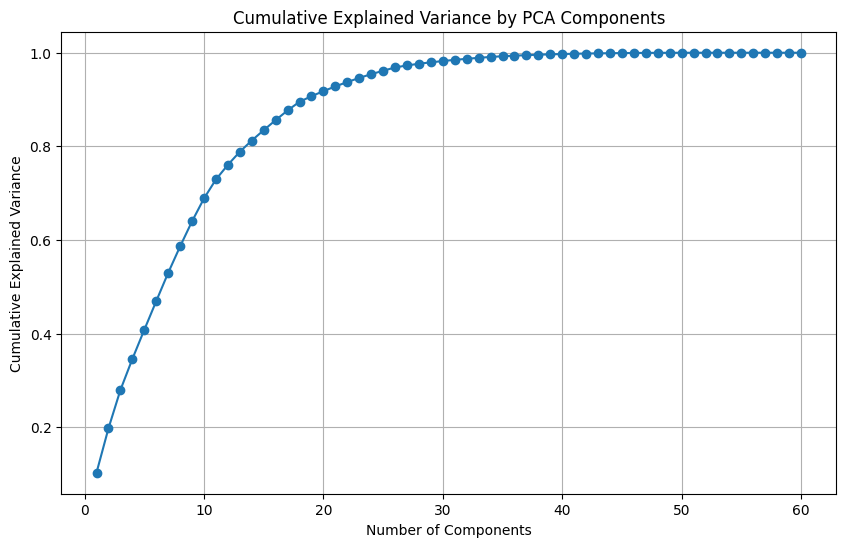

Selected 24 components to retain at least 95% of the variance.


In [70]:
# Step 3: Dimensionality Reduction (show cumulative variance before selecting components)
pca = PCA()
pca_fit = pca.fit(df_normalized)
explained_variance = np.cumsum(pca_fit.explained_variance_ratio_)

# Plot cumulative variance explained by PCA components
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.show()

# Select enough components to retain at least 95% variance
n_components = np.argmax(explained_variance >= 0.95) + 1  # Add 1 because of 0-based indexing
pca = PCA(n_components=n_components)
pca_fit = pca.fit(df_normalized)
reduced_data = pca.transform(df_normalized)

print(f'Selected {n_components} components to retain at least 95% of the variance.')

# Sammenlikne performance metric


Evaluating 2 clusters:
Cluster Size 2: {'KMeans': np.float64(3.1621015862837534), 'GaussianMixture': np.float64(3.2343316096840153), 'FuzzyCMeans': np.float64(3.2318339767289315)}

Evaluating 3 clusters:
Cluster Size 3: {'KMeans': np.float64(2.334461301906804), 'GaussianMixture': np.float64(2.46309679189419), 'FuzzyCMeans': np.float64(2.651214374998742)}

Evaluating 4 clusters:
Cluster Size 4: {'KMeans': np.float64(2.2503884395103695), 'GaussianMixture': np.float64(2.283381704534575), 'FuzzyCMeans': np.float64(2.274656408572353)}

Evaluating 5 clusters:
Cluster Size 5: {'KMeans': np.float64(2.1611606457656807), 'GaussianMixture': np.float64(2.165423982546935), 'FuzzyCMeans': np.float64(2.2726591041464843)}

Evaluating 6 clusters:
Cluster Size 6: {'KMeans': np.float64(2.239562709427768), 'GaussianMixture': np.float64(2.217997545916139), 'FuzzyCMeans': np.float64(1.9805133381042435)}

Evaluating 7 clusters:
Cluster Size 7: {'KMeans': np.float64(2.247498287253933), 'GaussianMixture': np.

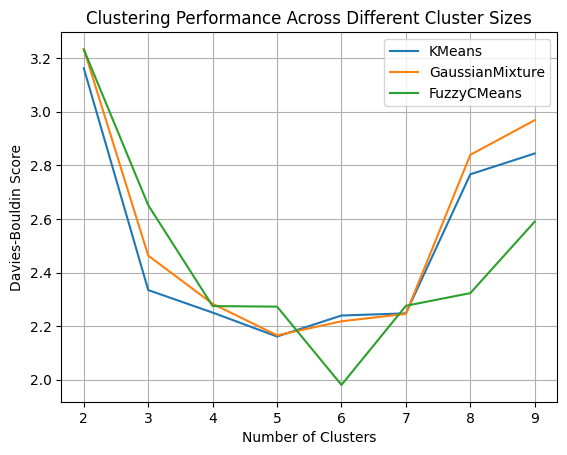

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import davies_bouldin_score
from pyclustering.cluster.fcm import fcm
from pyclustering.utils.metric import distance_metric, type_metric

def evaluate_clustering_with_fuzzy(data, max_clusters=10):
    scores = {}
    data_list = data.tolist()  # Convert to list of lists for pyclustering compatibility
    
    for n_clusters in range(2, max_clusters + 1):
        print(f"\nEvaluating {n_clusters} clusters:")
        results = {}

        # KMeans
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans_labels = kmeans.fit_predict(data)
        results['KMeans'] = davies_bouldin_score(data, kmeans_labels)

        # Gaussian Mixture
        gmm = GaussianMixture(n_components=n_clusters, random_state=42)
        gmm_labels = gmm.fit_predict(data)
        results['GaussianMixture'] = davies_bouldin_score(data, gmm_labels)

        # Fuzzy C-Means using pyclustering
        # Initialize centers using KMeans
        initial_centers = KMeans(n_clusters=n_clusters, random_state=42).fit(data).cluster_centers_.tolist()
        fcm_instance = fcm(data_list, initial_centers)
        fcm_instance.process()
        fcm_labels = fcm_instance.get_clusters()
        
        # Convert the cluster assignments to a format compatible with davies_bouldin_score
        fuzzy_labels = np.zeros(len(data), dtype=int)
        for cluster_id, cluster_points in enumerate(fcm_labels):
            for point_index in cluster_points:
                fuzzy_labels[point_index] = cluster_id
        
        # Evaluate Davies-Bouldin score for fuzzy clustering
        if len(set(fuzzy_labels)) > 1:  # Check to avoid calculation error with 1 unique cluster
            results['FuzzyCMeans'] = davies_bouldin_score(data, fuzzy_labels)
        else:
            results['FuzzyCMeans'] = np.nan  # Handle case with no meaningful clustering

        print(f"Cluster Size {n_clusters}: {results}")
        scores[n_clusters] = results

    return scores

# Evaluate clustering performance on selected features
cluster_scores = evaluate_clustering_with_fuzzy(reduced_data, max_clusters=9)

# Visualize performance scores
for method in ['KMeans', 'GaussianMixture', 'FuzzyCMeans']:
    plt.plot(
        list(cluster_scores.keys()), 
        [cluster_scores[k][method] for k in cluster_scores.keys()],
        label=method
    )

plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Score')
plt.title('Clustering Performance Across Different Cluster Sizes')
plt.legend()
plt.grid()
plt.show()

# Selection

Threshold score at 90.0% percentile: 0.16


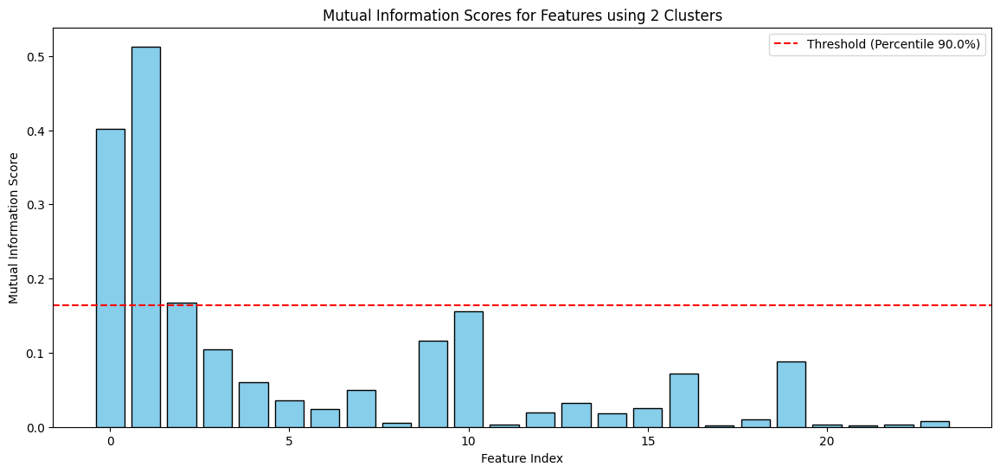

Threshold score at 90.0% percentile: 0.27


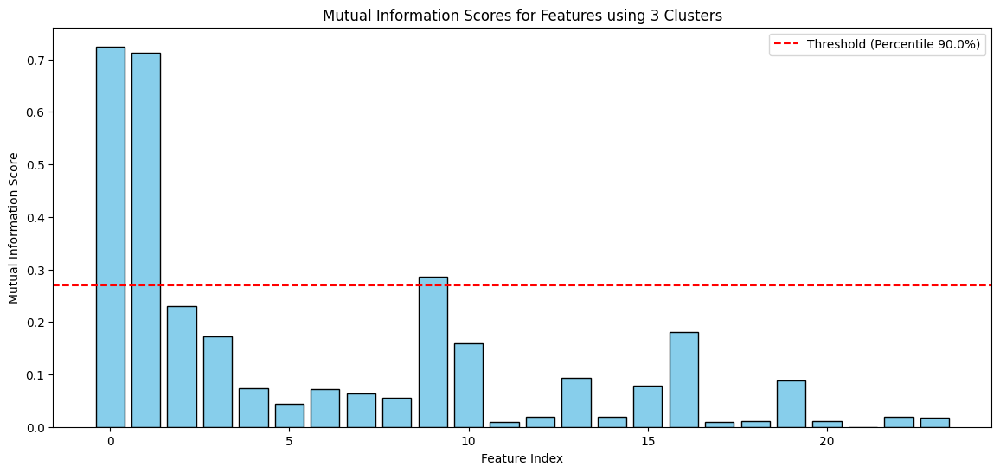

Threshold score at 90.0% percentile: 0.51


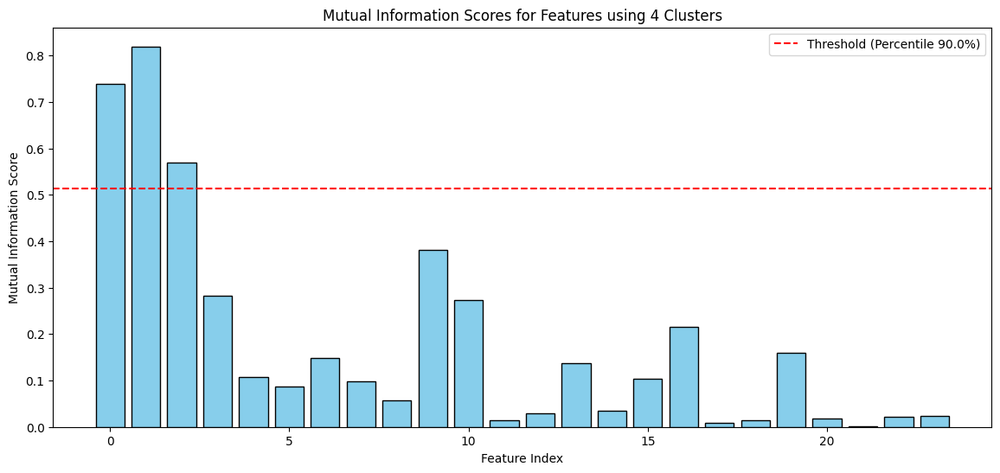

Threshold score at 90.0% percentile: 0.55


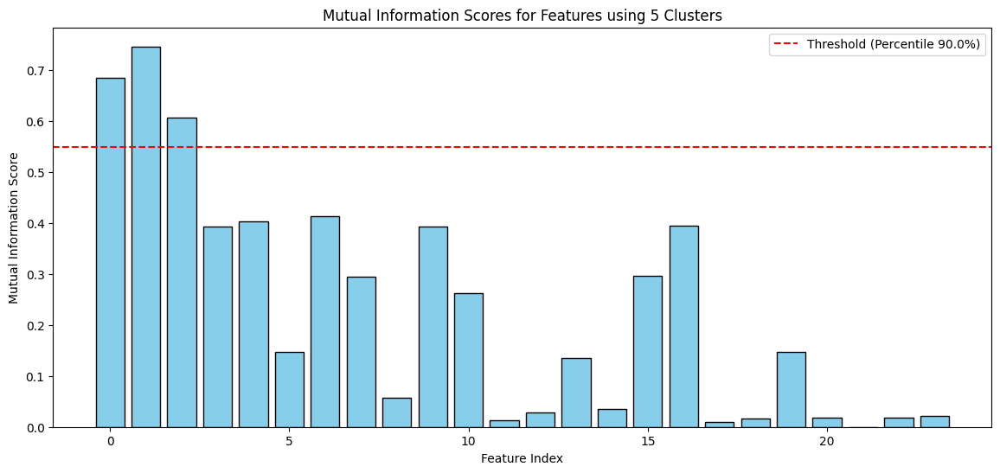

Threshold score at 90.0% percentile: 0.61


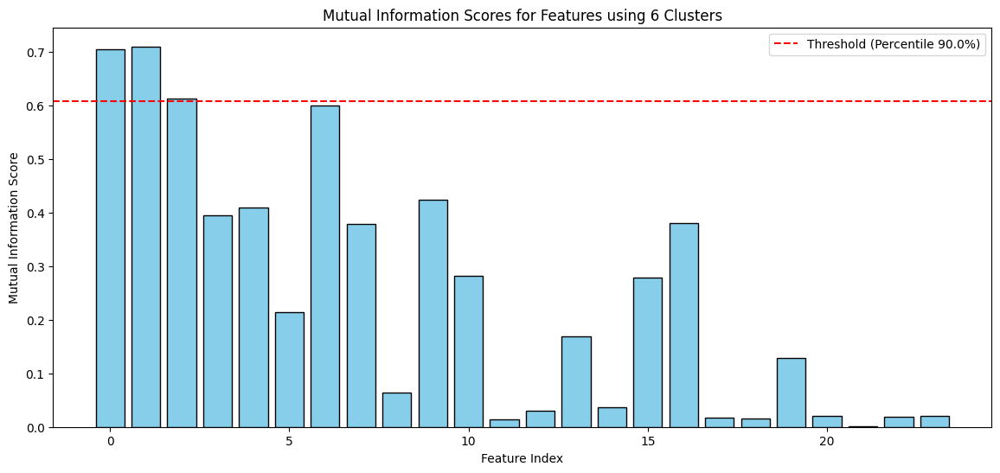

Threshold score at 90.0% percentile: 0.65


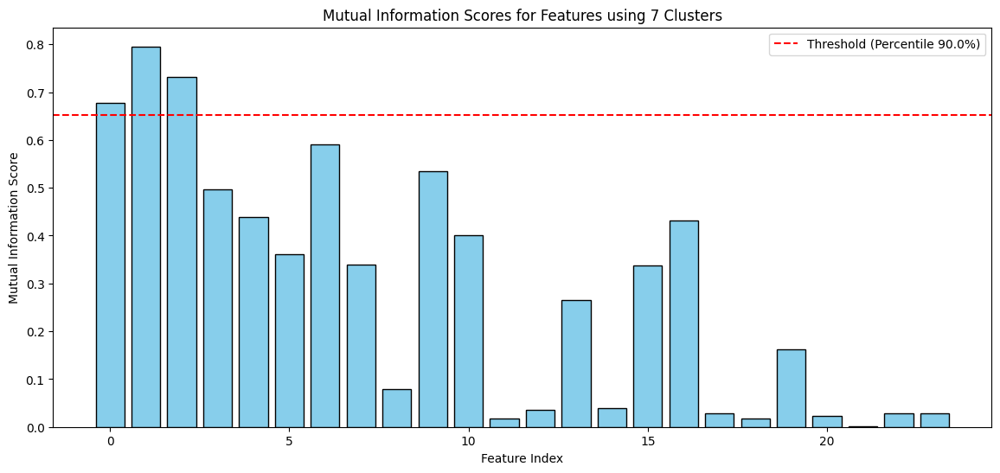

Threshold score at 90.0% percentile: 0.69


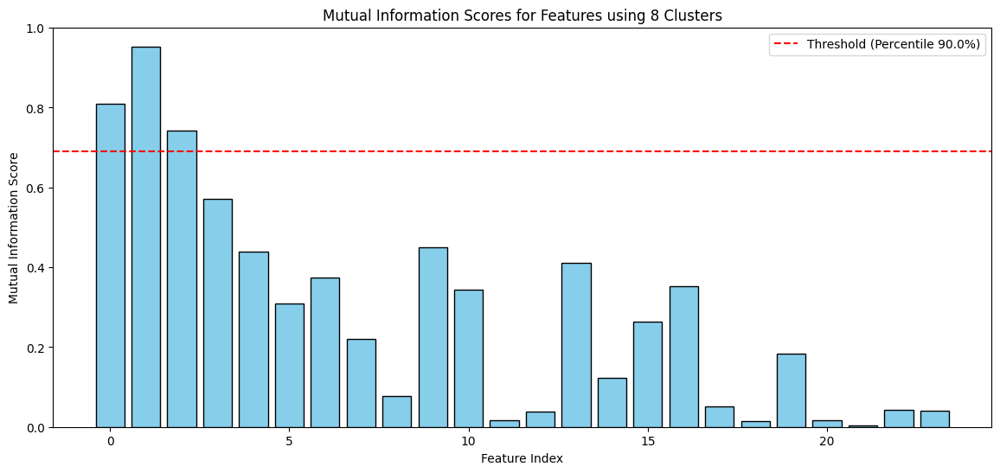

Threshold score at 90.0% percentile: 0.75


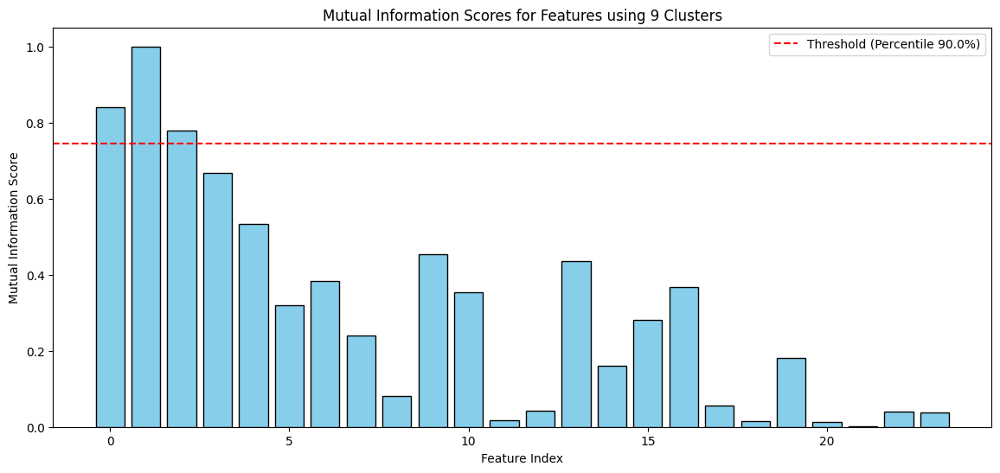

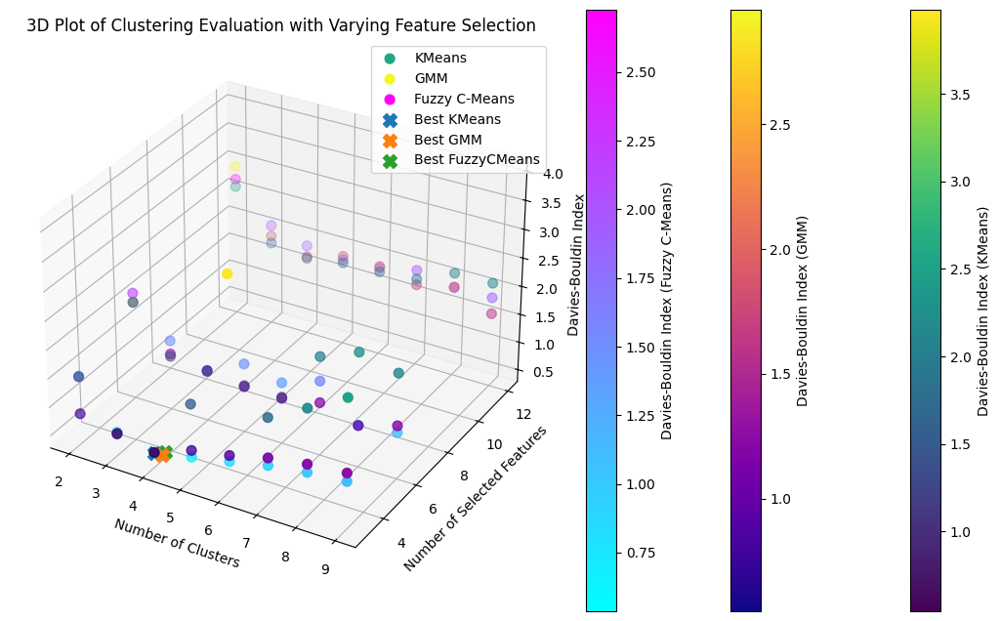

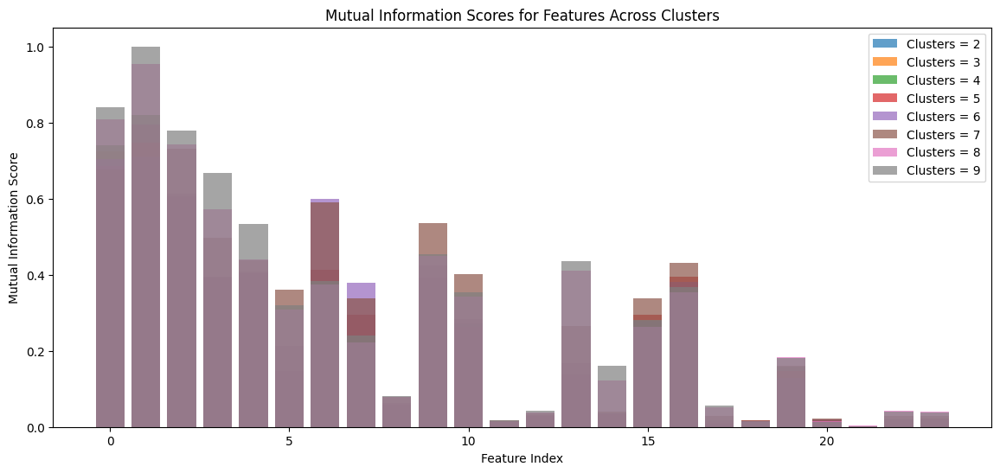

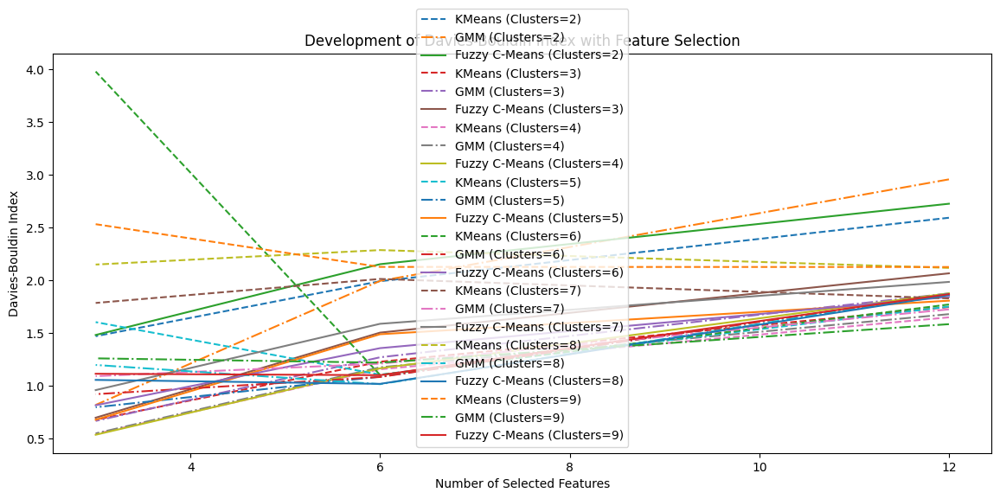

Best combination found for KMeans:
Number of Clusters: 4
Number of Selected Features: 3
Davies-Bouldin Index: 0.54
Selected Feature Indices: [0, 1, 2]
Best combination found for GMM:
Number of Clusters: 4
Number of Selected Features: 3
Davies-Bouldin Index: 0.54
Selected Feature Indices: [0, 1, 2]
Best combination found for FuzzyCMeans:
Number of Clusters: 4
Number of Selected Features: 3
Davies-Bouldin Index: 0.54
Selected Feature Indices: [0, 1, 2]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import davies_bouldin_score
from sklearn.feature_selection import mutual_info_classif
from pyclustering.cluster.fcm import fcm

def filter_feature_selection(data, max_clusters=10, percentiles=[0.9]):
    db_scores = []
    all_mi_scores = []

    # Iterate over each number of clusters
    for n_clusters in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(data)

        # Calculate mutual information scores for all features
        mi_scores = mutual_info_classif(data, labels, discrete_features=False)

        threshold_score = np.percentile(mi_scores, 0.9 * 100)
        print(f"Threshold score at {0.9*100}% percentile: {threshold_score:.2f}")
        plt.figure(figsize=(14, 6))
        plt.bar(range(len(mi_scores)), mi_scores, color='skyblue', edgecolor='black')
        plt.axhline(y=threshold_score, color='red', linestyle='--', label=f'Threshold (Percentile {0.9*100}%)')
        plt.xlabel('Feature Index')
        plt.ylabel('Mutual Information Score')
        plt.title(f'Mutual Information Scores for Features using {n_clusters} Clusters')
        plt.legend()
        plt.show()

        all_mi_scores.append((n_clusters, mi_scores))

        # Iterate over different percentiles to select feature subsets
        for percentile in percentiles:
            threshold_score = np.percentile(mi_scores, percentile * 100)
            selected_features = [i for i, score in enumerate(mi_scores) if score >= threshold_score]

            if len(selected_features) > 0:
                data_selected = data[:, selected_features]

                # Evaluate DB score for KMeans
                db_index_kmeans = davies_bouldin_score(data_selected, labels)

                # Evaluate DB score for GMM
                gmm = GaussianMixture(n_components=n_clusters, random_state=42)
                gmm_labels = gmm.fit_predict(data_selected)
                db_index_gmm = davies_bouldin_score(data_selected, gmm_labels)

                # Evaluate DB score for FCM
                initial_centers = KMeans(n_clusters=n_clusters, random_state=42).fit(data_selected).cluster_centers_.tolist()
                fcm_instance = fcm(data_selected.tolist(), initial_centers)
                fcm_instance.process()
                fcm_labels = fcm_instance.get_clusters()

                fuzzy_labels = np.zeros(len(data_selected), dtype=int)
                for cluster_id, cluster_points in enumerate(fcm_labels):
                    for point_index in cluster_points:
                        fuzzy_labels[point_index] = cluster_id

                if len(set(fuzzy_labels)) > 1:
                    db_index_fcm = davies_bouldin_score(data_selected, fuzzy_labels)
                else:
                    db_index_fcm = np.nan

                # Store the scores
                db_scores.append((n_clusters, len(selected_features), db_index_kmeans, db_index_gmm, db_index_fcm, selected_features))

    # Find the best combination for each method
    best_combination = {
        'KMeans': min(db_scores, key=lambda x: x[2]),
        'GMM': min(db_scores, key=lambda x: x[3]),
        'FuzzyCMeans': min(db_scores, key=lambda x: x[4])
    }

    return db_scores, best_combination, all_mi_scores

# Run the feature selection and clustering evaluation
db_scores, best_combination, all_mi_scores = filter_feature_selection(reduced_data, max_clusters=9, percentiles=[0.9])

# Extract data for plotting
n_clusters_list, feature_counts, db_indices_kmeans, db_indices_gmm, db_indices_fcm, feature_subsets = zip(*db_scores)

# Plotting the 3D plot with highlighted best combination
fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of DB scores for each method
sc_kmeans = ax.scatter(n_clusters_list, feature_counts, db_indices_kmeans, c=db_indices_kmeans, cmap='viridis', s=50, label='KMeans')
sc_gmm = ax.scatter(n_clusters_list, feature_counts, db_indices_gmm, c=db_indices_gmm, cmap='plasma', s=50, label='GMM')
sc_fcm = ax.scatter(n_clusters_list, feature_counts, db_indices_fcm, c=db_indices_fcm, cmap='cool', s=50, label='Fuzzy C-Means')

# Highlight the best combinations with an offset to avoid overlap
offset = 0.2
for i, (method, best_comb) in enumerate(best_combination.items()):
    ax.scatter(
        best_comb[0] + (offset if i > 0 else 0),
        best_comb[1] + (offset if i > 1 else 0),
        best_comb[2],
        label=f'Best {method}',
        s=100,
        marker='X'
    )

ax.set_xlabel('Number of Clusters')
ax.set_ylabel('Number of Selected Features')
ax.set_zlabel('Davies-Bouldin Index')
ax.set_title('3D Plot of Clustering Evaluation with Varying Feature Selection')
plt.colorbar(sc_kmeans, label='Davies-Bouldin Index (KMeans)')
plt.colorbar(sc_gmm, label='Davies-Bouldin Index (GMM)')
plt.colorbar(sc_fcm, label='Davies-Bouldin Index (Fuzzy C-Means)')
ax.legend()

plt.show()

# Plotting the Mutual Information (MI) scores as a bar chart
fig, ax = plt.subplots(figsize=(14, 6))
for n_clusters, mi_scores in all_mi_scores:
    ax.bar(range(len(mi_scores)), mi_scores, label=f'Clusters = {n_clusters}', alpha=0.7)

ax.set_xlabel('Feature Index')
ax.set_ylabel('Mutual Information Score')
ax.set_title('Mutual Information Scores for Features Across Clusters')
ax.legend()

plt.show()

# Plotting the development of the DB index as a function of the number of clusters and feature selection
fig, ax = plt.subplots(figsize=(14, 6))
db_indices_per_cluster = {}

for n_clusters, feature_count, db_index_kmeans, db_index_gmm, db_index_fcm, _ in db_scores:
    if n_clusters not in db_indices_per_cluster:
        db_indices_per_cluster[n_clusters] = []
    db_indices_per_cluster[n_clusters].append((feature_count, db_index_kmeans, db_index_gmm, db_index_fcm))

# Plot DB index as a function of number of features for each clustering method
for n_clusters, values in db_indices_per_cluster.items():
    feature_counts, db_indices_kmeans, db_indices_gmm, db_indices_fcm = zip(*values)
    ax.plot(feature_counts, db_indices_kmeans, label=f'KMeans (Clusters={n_clusters})', linestyle='--')
    ax.plot(feature_counts, db_indices_gmm, label=f'GMM (Clusters={n_clusters})', linestyle='-.')
    ax.plot(feature_counts, db_indices_fcm, label=f'Fuzzy C-Means (Clusters={n_clusters})', linestyle='-')

ax.set_xlabel('Number of Selected Features')
ax.set_ylabel('Davies-Bouldin Index')
ax.set_title('Development of Davies-Bouldin Index with Feature Selection')
ax.legend()

plt.show()

# Print out the best combinations for each method
for method, best_comb in best_combination.items():
    print(f"Best combination found for {method}:")
    print(f"Number of Clusters: {best_comb[0]}")
    print(f"Number of Selected Features: {best_comb[1]}")
    print(f"Davies-Bouldin Index: {best_comb[2]:.2f}")
    print(f"Selected Feature Indices: {best_comb[5]}")


Threshold score at 90.0% percentile: 0.51


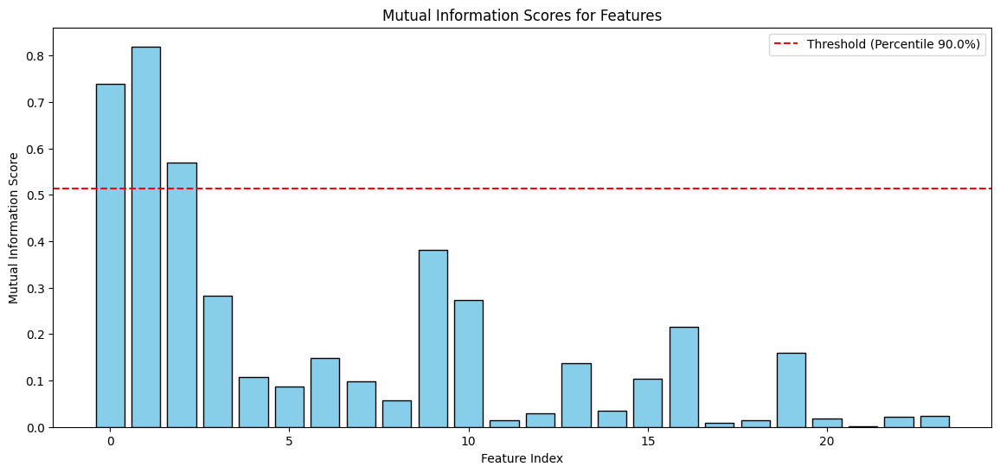

Selected feature indices: [0, 1, 2]
Number of selected features: 3


In [ ]:
def filter_feature_selection(data, n_clusters, percentile=0.75):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(data)
    mi_scores = mutual_info_classif(data, labels, discrete_features=False)
    threshold_score = np.percentile(mi_scores, percentile * 100)
    return [i for i, score in enumerate(mi_scores) if score >= threshold_score]

n_clusters = N_CLUSTERS
percentile = 0.9
selected_features = filter_feature_selection(reduced_data, n_clusters, percentile=percentile)
print(f"Selected feature indices: {selected_features}")
print(f"Number of selected features: {len(selected_features)}")
reduced_data_selected = reduced_data[:, selected_features]


Evaluating 2 clusters:
Cluster Size 2: {'KMeans': np.float64(0.8183359891312751), 'GaussianMixture': np.float64(0.8194081679452158), 'FuzzyCMeans': np.float64(1.4826137113267797)}

Evaluating 3 clusters:
Cluster Size 3: {'KMeans': np.float64(0.8637409852101032), 'GaussianMixture': np.float64(1.1244077155755197), 'FuzzyCMeans': np.float64(0.7913052876044796)}

Evaluating 4 clusters:
Cluster Size 4: {'KMeans': np.float64(0.5362852835448474), 'GaussianMixture': np.float64(0.549394152999741), 'FuzzyCMeans': np.float64(0.5365007874293346)}

Evaluating 5 clusters:
Cluster Size 5: {'KMeans': np.float64(0.6805775626470644), 'GaussianMixture': np.float64(0.7973593047616264), 'FuzzyCMeans': np.float64(0.679051122101981)}

Evaluating 6 clusters:
Cluster Size 6: {'KMeans': np.float64(0.776526902853154), 'GaussianMixture': np.float64(0.9214441611663894), 'FuzzyCMeans': np.float64(0.8161326588989107)}

Evaluating 7 clusters:
Cluster Size 7: {'KMeans': np.float64(0.928845210084447), 'GaussianMixture

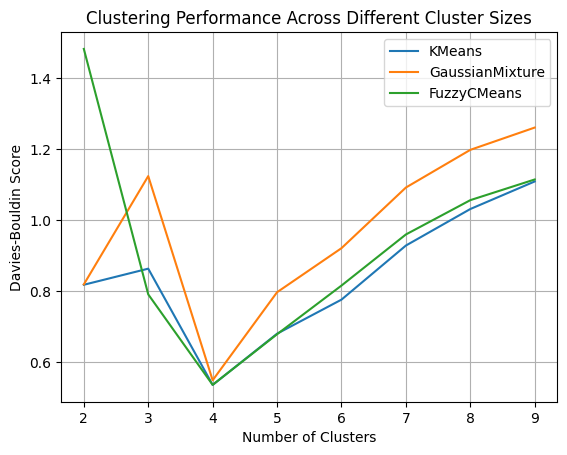

In [74]:
cluster_scores2 = evaluate_clustering_with_fuzzy(reduced_data_selected, max_clusters=9)
# Visualize performance scores
for method in ['KMeans', 'GaussianMixture', 'FuzzyCMeans']:
    plt.plot(
        list(cluster_scores2.keys()), 
        [cluster_scores2[k][method] for k in cluster_scores2.keys()],
        label=method
    )

plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Score')
plt.title('Clustering Performance Across Different Cluster Sizes')
plt.legend()
plt.grid()
plt.show()

# tsne

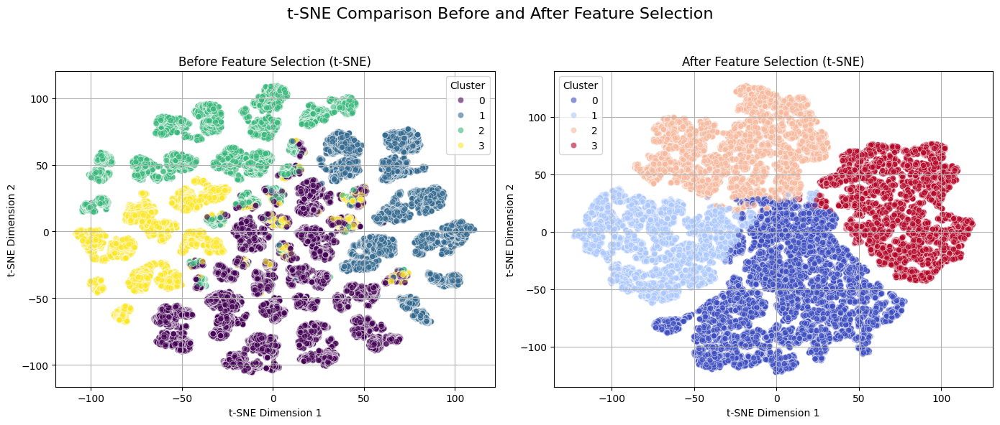

In [75]:
# Visualization: t-SNE Comparison Before and After Feature Selection
def plot_tsne_comparison(data_full, labels_full, data_selected, labels_selected, title):
    """
    Visualize clustering structure before and after feature selection using t-SNE.

    Parameters:
    - data_full: np.ndarray, full PCA data
    - labels_full: np.ndarray, cluster labels for full data
    - data_selected: np.ndarray, data after feature selection
    - labels_selected: np.ndarray, cluster labels for selected data
    - title: str, overall title for the plot
    """
    tsne_full = TSNE(n_components=2, random_state=42).fit_transform(data_full)
    tsne_selected = TSNE(n_components=2, random_state=42).fit_transform(data_selected)

    plt.figure(figsize=(14, 6))

    # t-SNE for full data
    plt.subplot(1, 2, 1)
    sns.scatterplot(
        x=tsne_full[:, 0],
        y=tsne_full[:, 1],
        hue=labels_full,
        palette="viridis",
        alpha=0.6,
    )
    plt.title("Before Feature Selection (t-SNE)")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.legend(title="Cluster")
    plt.grid()

    # t-SNE for selected data
    plt.subplot(1, 2, 2)
    sns.scatterplot(
        x=tsne_selected[:, 0],
        y=tsne_selected[:, 1],
        hue=labels_selected,
        palette="coolwarm",
        alpha=0.6,
    )
    plt.title("After Feature Selection (t-SNE)")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.legend(title="Cluster")
    plt.grid()

    # Add a main title
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Perform clustering on full PCA data
kmeans_full = KMeans(n_clusters=N_CLUSTERS, random_state=42).fit(reduced_data)
labels_full = kmeans_full.labels_

# Perform clustering on selected features
kmeans_selected = KMeans(n_clusters=N_CLUSTERS, random_state=42).fit(reduced_data_selected)
labels_selected = kmeans_selected.labels_

# Plot the comparison
plot_tsne_comparison(
    reduced_data,
    labels_full,
    reduced_data_selected,
    labels_selected,
    "t-SNE Comparison Before and After Feature Selection"
)

# Algoritmer

In [78]:
# **Algorithm 1: K-means Clustering**
kmeans = KMeans(n_clusters=N_CLUSTERS, random_state=42)
df['kmeans_cluster'] = kmeans.fit_predict(reduced_data_selected[:, :3])  # Use the first 3 PCA components for 3D plot

# Evaluate K-means clustering using Davies-Bouldin Index
kmeans_davies_bouldin = davies_bouldin_score(reduced_data_selected[:, :3], df['kmeans_cluster'])
print(f'K-means Davies-Bouldin Index: {kmeans_davies_bouldin:.5f}')

# **Algorithm 4: Gaussian Mixture Model (GMM)**
gmm = GaussianMixture(n_components=N_CLUSTERS, random_state=42)
df['gmm_cluster'] = gmm.fit_predict(reduced_data_selected[:, :3])  # Use the first 3 PCA components for 3D plot

# Evaluate GMM clustering using Davies-Bouldin Index
gmm_davies_bouldin = davies_bouldin_score(reduced_data_selected[:, :3], df['gmm_cluster'])
print(f'GMM Davies-Bouldin Index: {gmm_davies_bouldin:.5f}')

# **Algorithm 6: Fuzzy C-Means Clustering**
from pyclustering.cluster.fcm import fcm
from pyclustering.utils.metric import distance_metric, type_metric

# Convert data to list format for pyclustering
data_list = reduced_data_selected.tolist()

# Initialize centers using KMeans
initial_centers = KMeans(n_clusters=N_CLUSTERS, random_state=42).fit(reduced_data_selected).cluster_centers_.tolist()

# Create and process FCM instance
fcm_instance = fcm(data_list, initial_centers)
fcm_instance.process()

# Get cluster assignments
fcm_labels = fcm_instance.get_clusters()

# Convert cluster assignments to a format compatible with Davies-Bouldin score
fuzzy_labels = np.zeros(len(reduced_data_selected), dtype=int)
for cluster_id, cluster_points in enumerate(fcm_labels):
    for point_index in cluster_points:
        fuzzy_labels[point_index] = cluster_id

# Assign cluster labels to the DataFrame
df['fuzzy_cmeans_cluster'] = fuzzy_labels

# Evaluate Fuzzy C-Means clustering using Davies-Bouldin Index
if len(set(df['fuzzy_cmeans_cluster'])) > 1:
    fuzzy_cmeans_davies_bouldin = davies_bouldin_score(reduced_data_selected, df['fuzzy_cmeans_cluster'])
    print(f'Fuzzy C-Means Davies-Bouldin Index: {fuzzy_cmeans_davies_bouldin:.5f}')
else:
    print('Fuzzy C-Means did not find any clusters (only noise).')

K-means Davies-Bouldin Index: 0.53629
GMM Davies-Bouldin Index: 0.54939
Fuzzy C-Means Davies-Bouldin Index: 0.53650


# Plotting

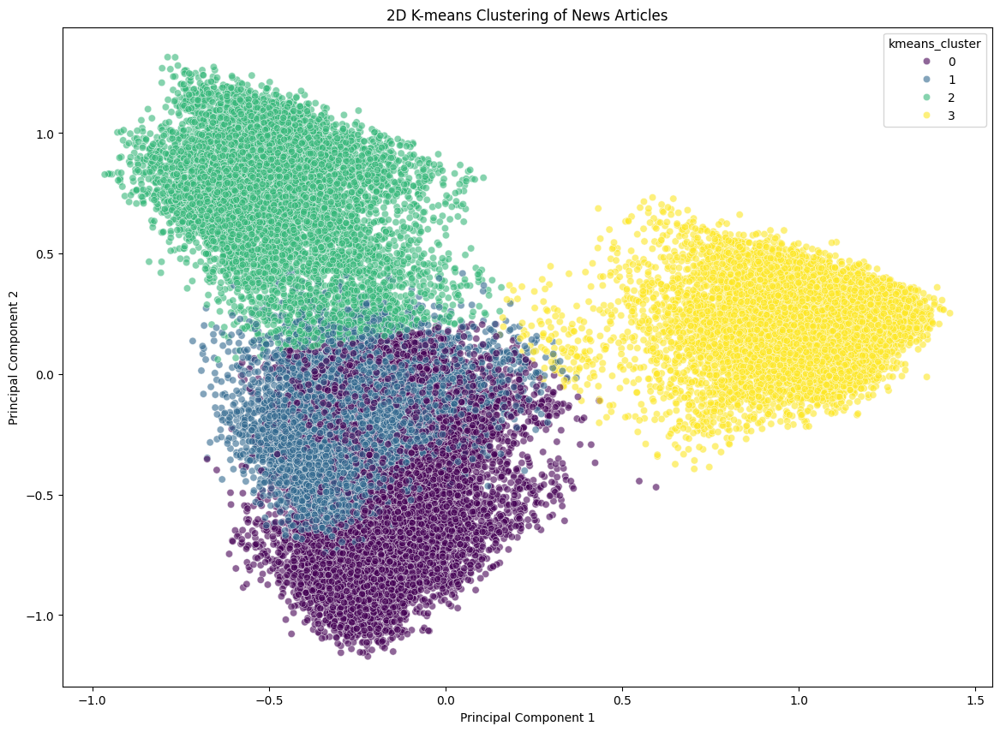

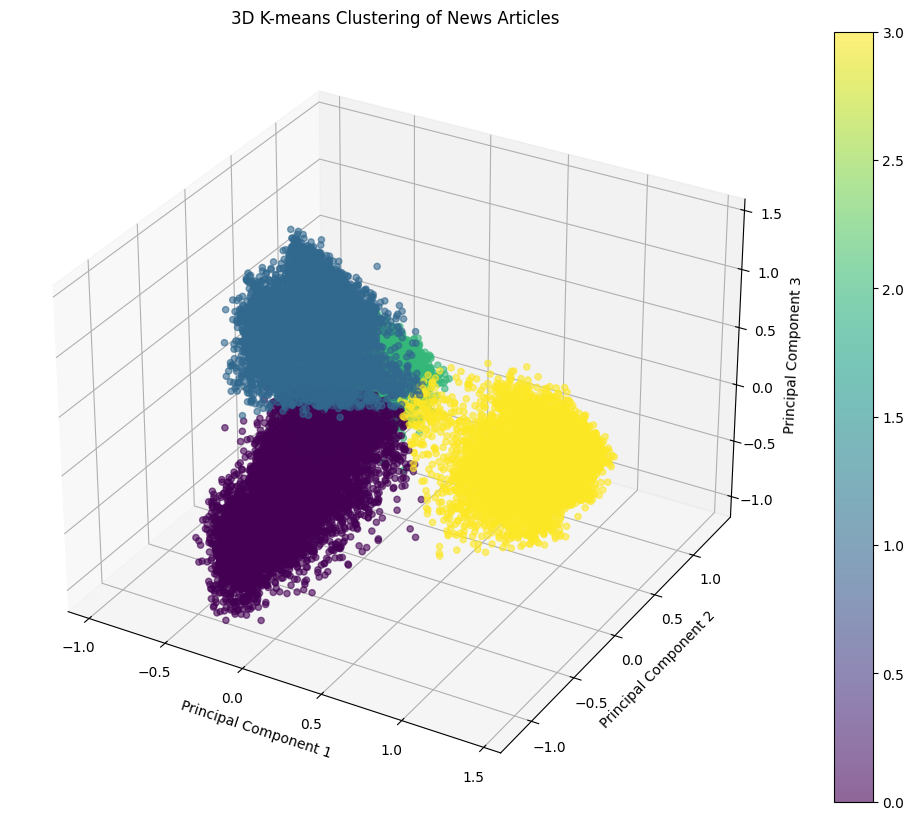

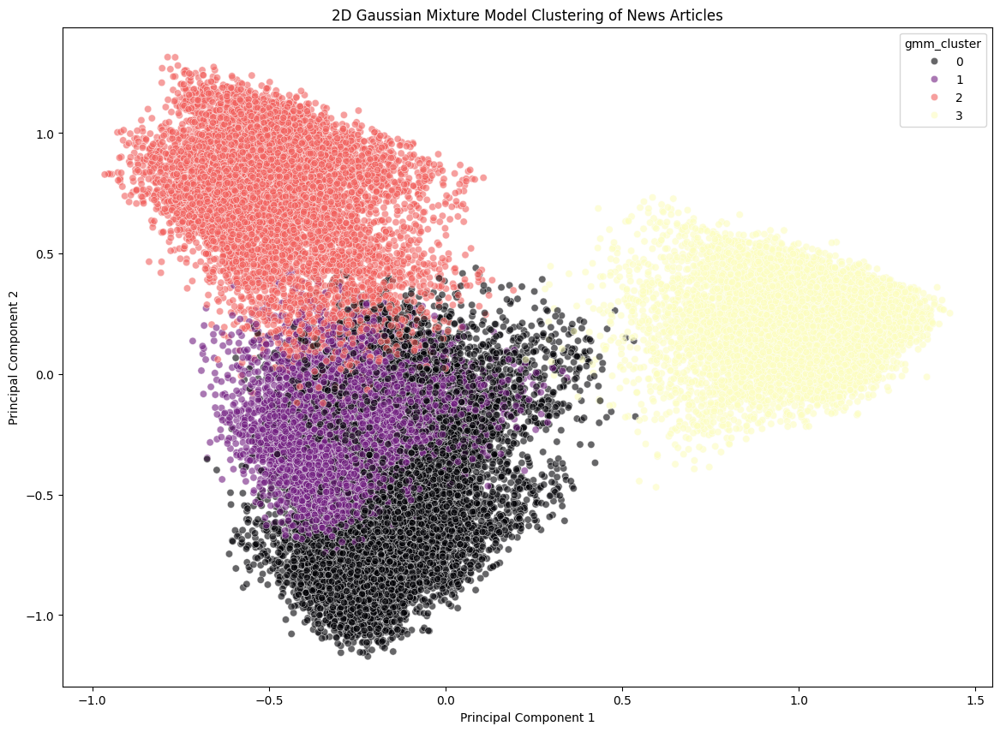

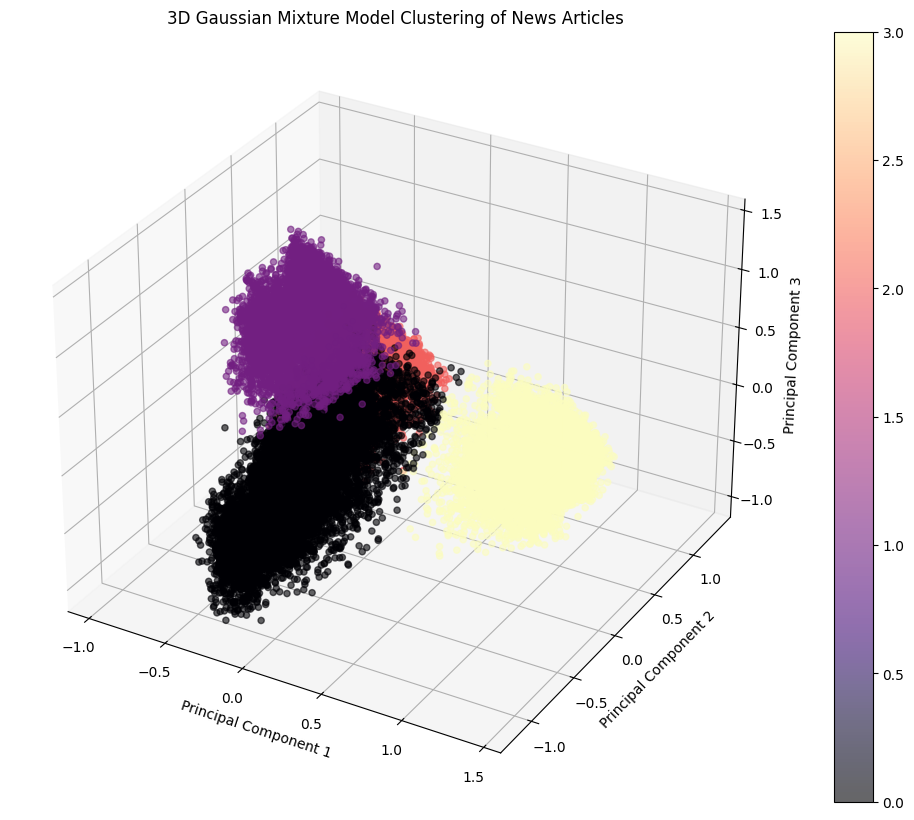

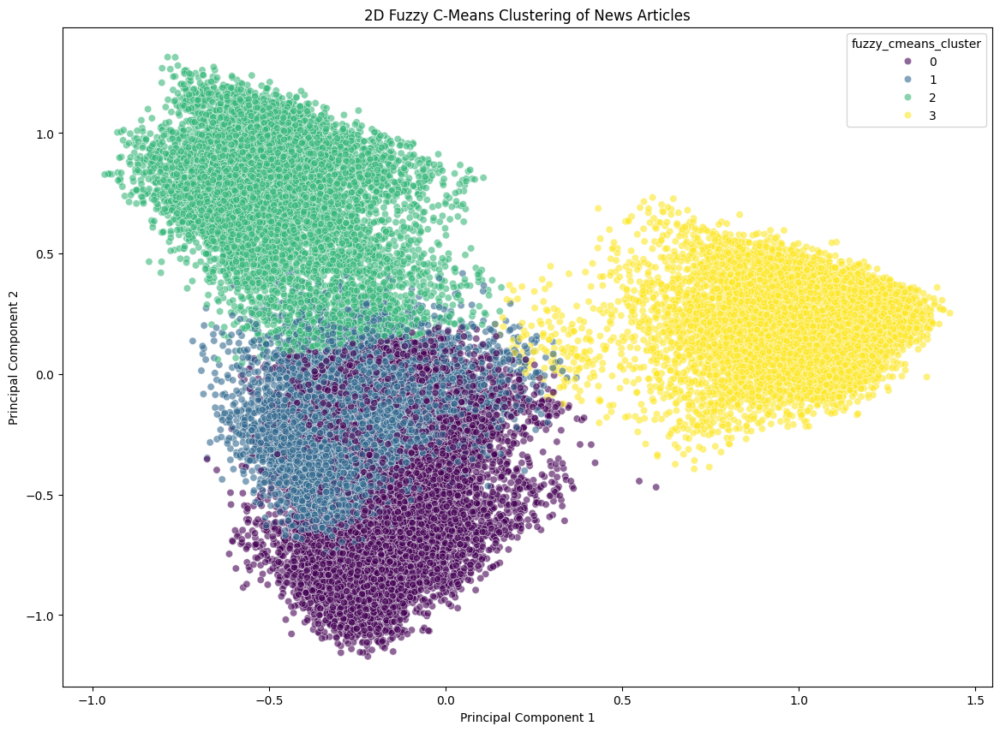

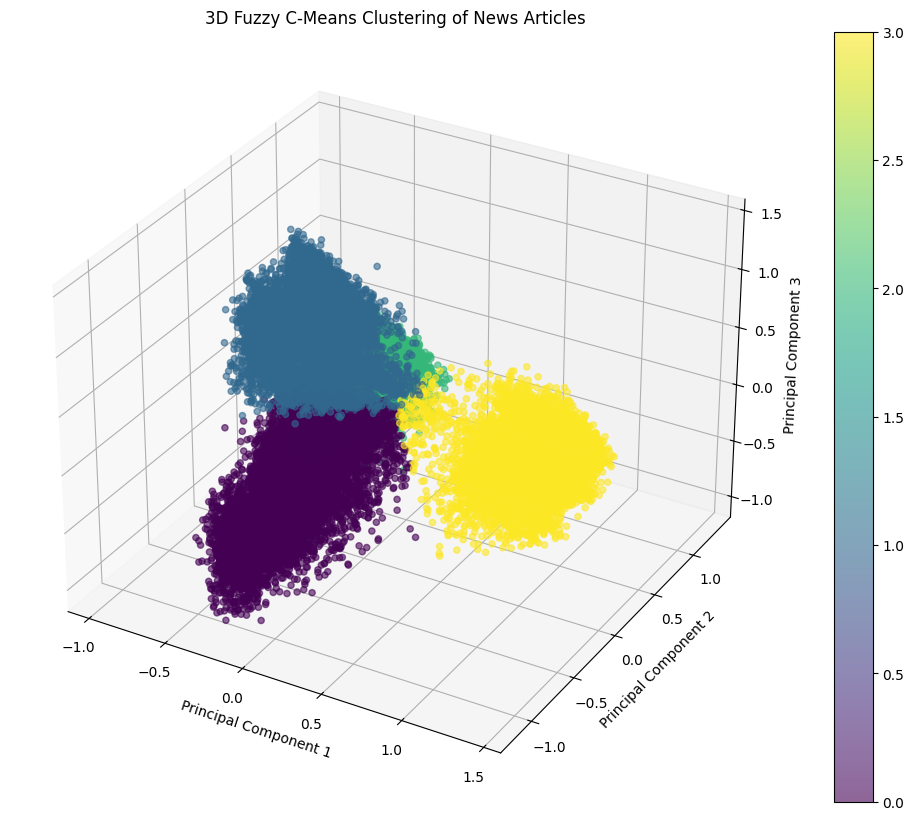

In [77]:
# 2D K-means plot
plt.figure(figsize=(14, 10))
sns.scatterplot(x=reduced_data_selected[:, 0], y=reduced_data_selected[:, 1], hue=df['kmeans_cluster'], palette='viridis', alpha=0.6)
plt.title('2D K-means Clustering of News Articles')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# 3D K-means plot
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(reduced_data_selected[:, 0], reduced_data_selected[:, 1], reduced_data_selected[:, 2], c=df['kmeans_cluster'], cmap='viridis', alpha=0.6)
plt.title('3D K-means Clustering of News Articles')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.colorbar(sc)
plt.show()

# 2D GMM plot
plt.figure(figsize=(14, 10))
sns.scatterplot(x=reduced_data_selected[:, 0], y=reduced_data_selected[:, 1], hue=df['gmm_cluster'], palette='magma', alpha=0.6)
plt.title('2D Gaussian Mixture Model Clustering of News Articles')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# 3D GMM plot
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(reduced_data_selected[:, 0], reduced_data_selected[:, 1], reduced_data_selected[:, 2], c=df['gmm_cluster'], cmap='magma', alpha=0.6)
plt.title('3D Gaussian Mixture Model Clustering of News Articles')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.colorbar(sc)
plt.show()

# 2D Fuzzy C-Means plot
plt.figure(figsize=(14, 10))
sns.scatterplot(x=reduced_data_selected[:, 0], y=reduced_data_selected[:, 1], hue=df['fuzzy_cmeans_cluster'], palette='viridis', alpha=0.6)
plt.title('2D Fuzzy C-Means Clustering of News Articles')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# 3D Fuzzy C-Means plot
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(reduced_data_selected[:, 0], reduced_data_selected[:, 1], reduced_data_selected[:, 2], c=df['fuzzy_cmeans_cluster'], cmap='viridis', alpha=0.6)
plt.title('3D Fuzzy C-Means Clustering of News Articles')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.colorbar(sc)
plt.show()

# Compare

       Algorithm  Execution Time (s)  Davies-Bouldin Index  Silhouette Score
0         KMeans                0.02                  0.54              0.62
1            GMM                0.17                  0.55              0.61
2  Fuzzy C-Means                0.88                  0.54              0.62


C:\Users\ander\AppData\Local\Temp\ipykernel_22784\1192708613.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax1 = sns.barplot(x='Algorithm', y='Execution Time (s)', data=results_df, palette='viridis')


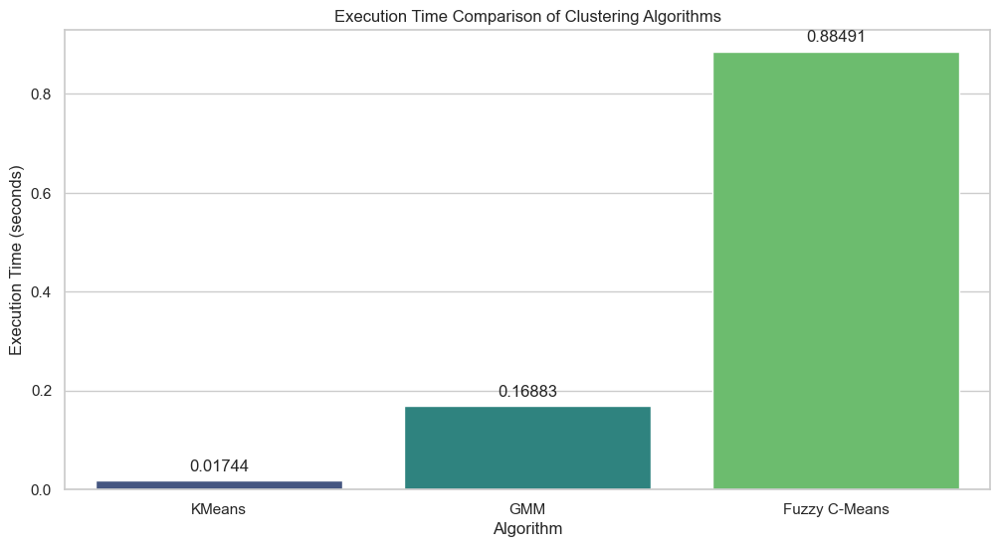

C:\Users\ander\AppData\Local\Temp\ipykernel_22784\1192708613.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax2 = sns.barplot(x='Algorithm', y='Davies-Bouldin Index', data=results_df, palette='plasma')


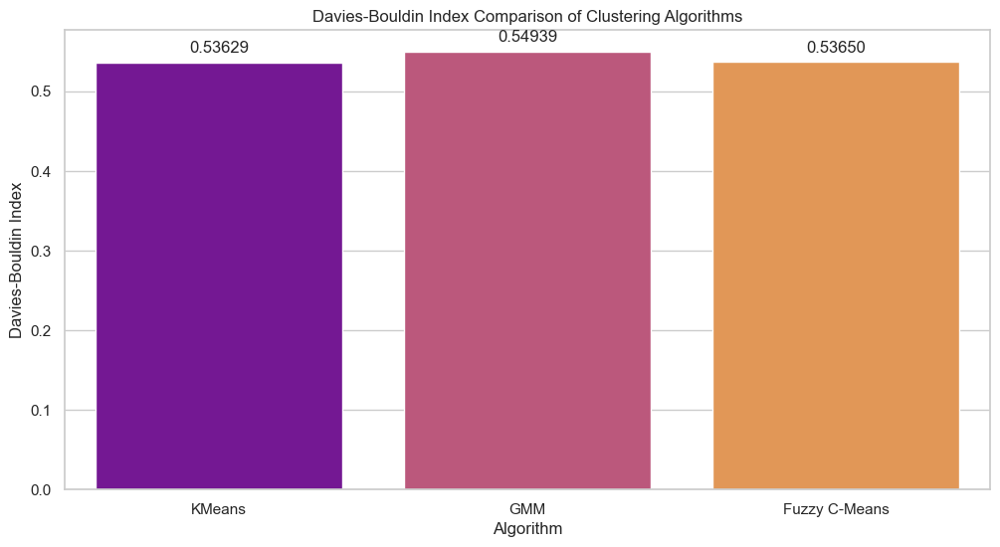

C:\Users\ander\AppData\Local\Temp\ipykernel_22784\1192708613.py:92: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax3 = sns.barplot(x='Algorithm', y='Silhouette Score', data=results_df, palette='coolwarm')


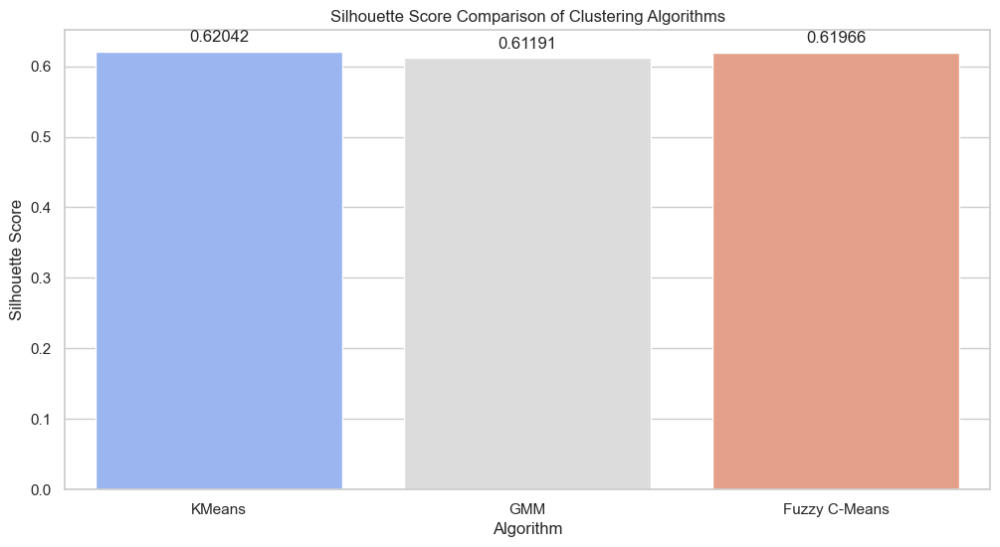

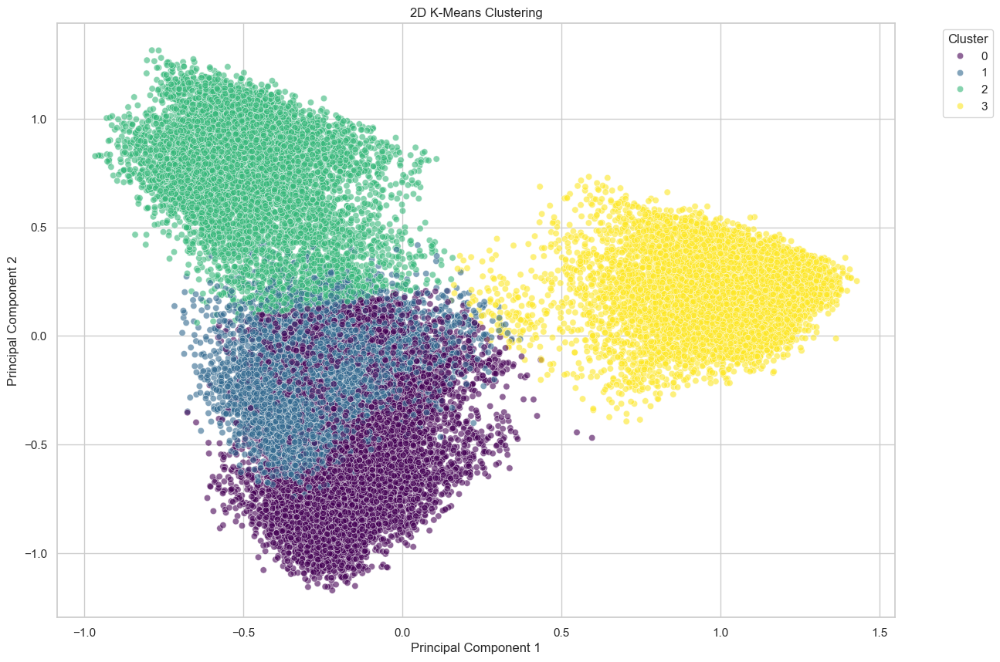

C:\Users\ander\AppData\Local\Temp\ipykernel_22784\1192708613.py:115: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')


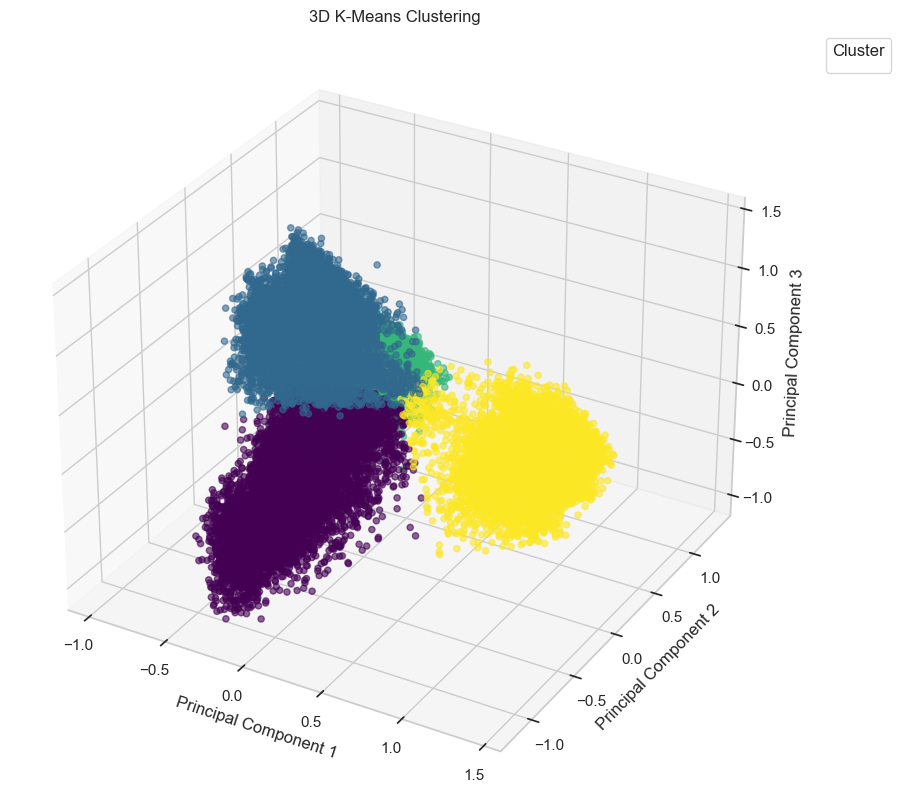

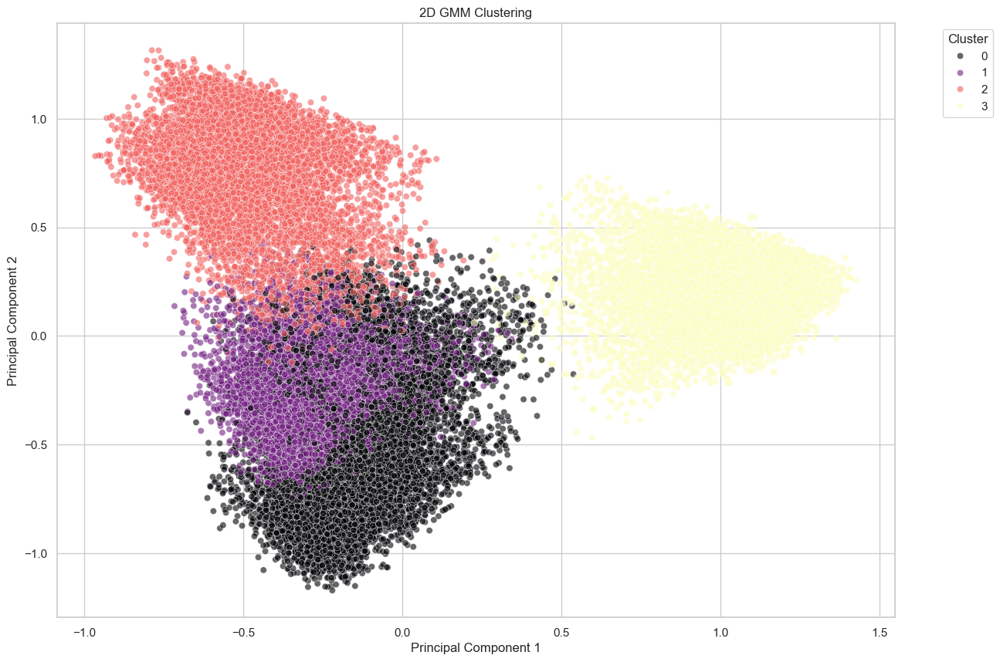

C:\Users\ander\AppData\Local\Temp\ipykernel_22784\1192708613.py:134: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')


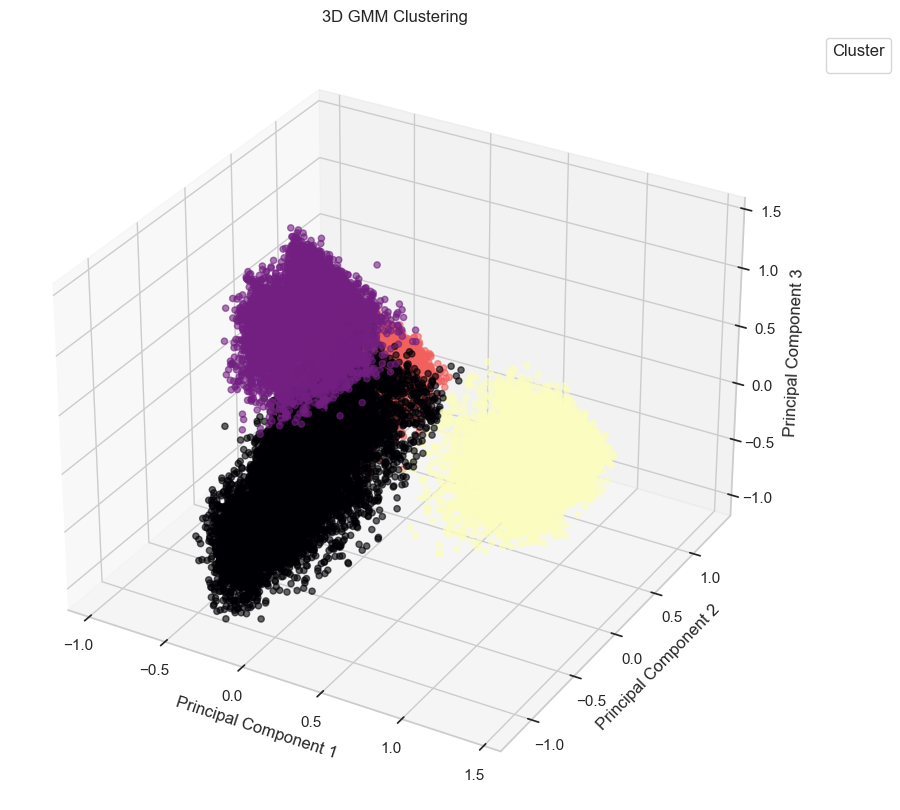

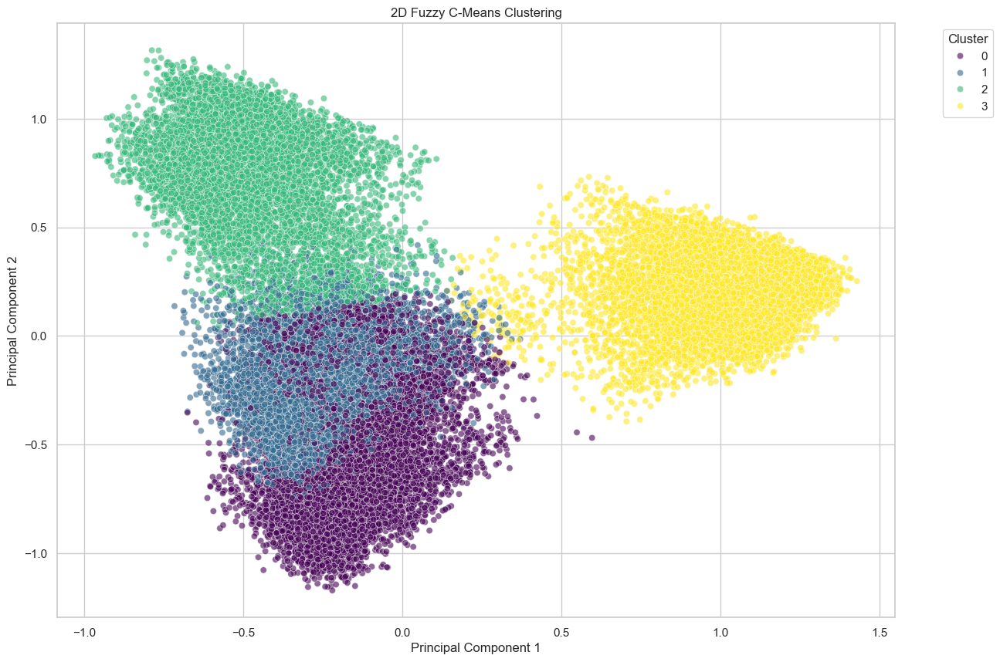

C:\Users\ander\AppData\Local\Temp\ipykernel_22784\1192708613.py:153: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')


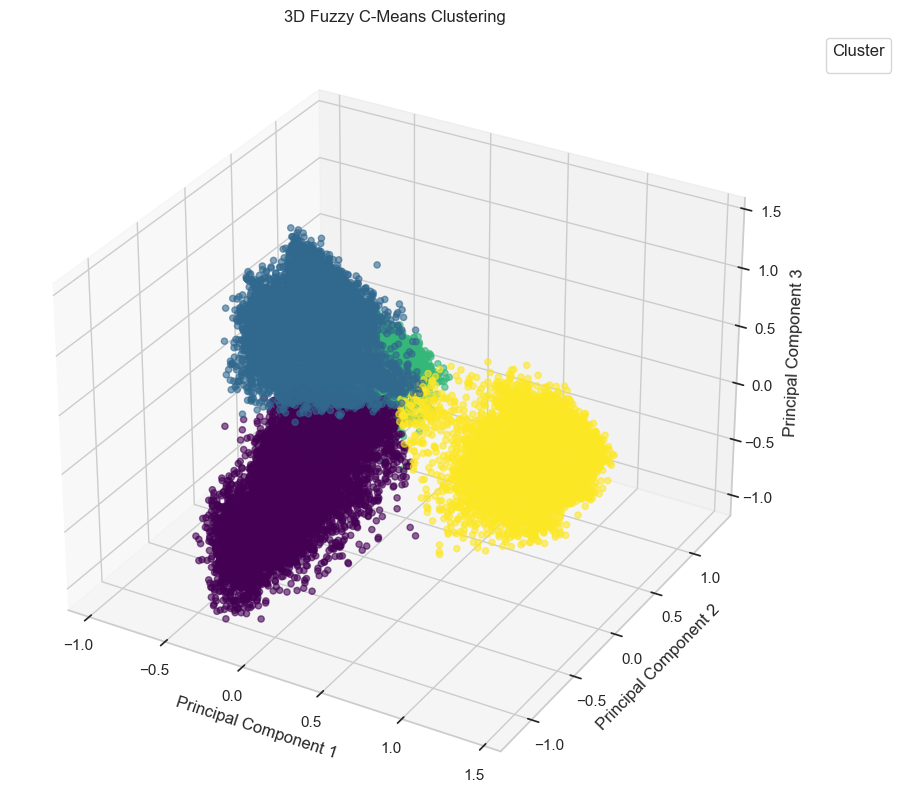

In [81]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import davies_bouldin_score, silhouette_score
from pyclustering.cluster.fcm import fcm
from pyclustering.utils.metric import distance_metric, type_metric

# Function to evaluate and measure runtime
def evaluate_algorithm(algorithm, data, algorithm_name):
    start_time = time.time()
    if algorithm_name == 'KMeans' or algorithm_name == 'GMM':
        labels = algorithm.fit_predict(data)
    elif algorithm_name == 'Fuzzy C-Means':
        data_list = data.tolist()
        initial_centers = KMeans(n_clusters=N_CLUSTERS, random_state=42).fit(data).cluster_centers_.tolist()
        fcm_instance = fcm(data_list, initial_centers)
        fcm_instance.process()
        labels = np.zeros(len(data), dtype=int)
        fcm_labels = fcm_instance.get_clusters()
        for cluster_id, cluster_points in enumerate(fcm_labels):
            for point_index in cluster_points:
                labels[point_index] = cluster_id

    execution_time = time.time() - start_time
    
    # Evaluate performance metrics
    davies_bouldin = davies_bouldin_score(data, labels)
    silhouette = silhouette_score(data, labels) if len(set(labels)) > 1 else -1  # Silhouette not defined for single cluster
    
    return labels, execution_time, davies_bouldin, silhouette

# Algorithm parameters
N_CLUSTERS = 4  # Example number of clusters

# Generate synthetic data or use your dataset
# Ensure `reduced_data_selected` is your preprocessed data (e.g., PCA components)

# Initialize algorithms
kmeans = KMeans(n_clusters=N_CLUSTERS, random_state=42)
gmm = GaussianMixture(n_components=N_CLUSTERS, random_state=42)

# Evaluate algorithms
kmeans_labels, kmeans_time, kmeans_dbi, kmeans_silhouette = evaluate_algorithm(kmeans, reduced_data_selected[:, :3], 'KMeans')
gmm_labels, gmm_time, gmm_dbi, gmm_silhouette = evaluate_algorithm(gmm, reduced_data_selected[:, :3], 'GMM')
fuzzy_labels, fuzzy_time, fuzzy_dbi, fuzzy_silhouette = evaluate_algorithm(None, reduced_data_selected[:, :3], 'Fuzzy C-Means')

# Print performance results
results_df = pd.DataFrame({
    'Algorithm': ['KMeans', 'GMM', 'Fuzzy C-Means'],
    'Execution Time (s)': [kmeans_time, gmm_time, fuzzy_time],
    'Davies-Bouldin Index': [kmeans_dbi, gmm_dbi, fuzzy_dbi],
    'Silhouette Score': [kmeans_silhouette, gmm_silhouette, fuzzy_silhouette]
})

print(results_df)

# Set plot style
sns.set(style='whitegrid')

# Function to add value labels to bars in bar charts
def add_value_labels(ax, spacing=5):
    for rect in ax.patches:
        height = rect.get_height()
        ax.annotate(f'{height:.5f}', xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, spacing), textcoords="offset points",
                    ha='center', va='bottom')

# Plot execution time comparison
plt.figure(figsize=(12, 6))
ax1 = sns.barplot(x='Algorithm', y='Execution Time (s)', data=results_df, palette='viridis')
plt.title('Execution Time Comparison of Clustering Algorithms')
plt.xlabel('Algorithm')
plt.ylabel('Execution Time (seconds)')
add_value_labels(ax1)
plt.show()

# Plot Davies-Bouldin Index comparison
plt.figure(figsize=(12, 6))
ax2 = sns.barplot(x='Algorithm', y='Davies-Bouldin Index', data=results_df, palette='plasma')
plt.title('Davies-Bouldin Index Comparison of Clustering Algorithms')
plt.xlabel('Algorithm')
plt.ylabel('Davies-Bouldin Index')
add_value_labels(ax2)
plt.show()

# Plot Silhouette Score comparison
plt.figure(figsize=(12, 6))
ax3 = sns.barplot(x='Algorithm', y='Silhouette Score', data=results_df, palette='coolwarm')
plt.title('Silhouette Score Comparison of Clustering Algorithms')
plt.xlabel('Algorithm')
plt.ylabel('Silhouette Score')
add_value_labels(ax3)
plt.show()

# 2D and 3D plots for K-Means
plt.figure(figsize=(14, 10))
sns.scatterplot(x=reduced_data_selected[:, 0], y=reduced_data_selected[:, 1], hue=kmeans_labels, palette='viridis', alpha=0.6, legend='full')
plt.title('2D K-Means Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(reduced_data_selected[:, 0], reduced_data_selected[:, 1], reduced_data_selected[:, 2], c=kmeans_labels, cmap='viridis', alpha=0.6)
plt.title('3D K-Means Clustering')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# 2D and 3D plots for GMM
plt.figure(figsize=(14, 10))
sns.scatterplot(x=reduced_data_selected[:, 0], y=reduced_data_selected[:, 1], hue=gmm_labels, palette='magma', alpha=0.6, legend='full')
plt.title('2D GMM Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(reduced_data_selected[:, 0], reduced_data_selected[:, 1], reduced_data_selected[:, 2], c=gmm_labels, cmap='magma', alpha=0.6)
plt.title('3D GMM Clustering')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# 2D and 3D plots for Fuzzy C-Means
plt.figure(figsize=(14, 10))
sns.scatterplot(x=reduced_data_selected[:, 0], y=reduced_data_selected[:, 1], hue=fuzzy_labels, palette='viridis', alpha=0.6, legend='full')
plt.title('2D Fuzzy C-Means Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(reduced_data_selected[:, 0], reduced_data_selected[:, 1], reduced_data_selected[:, 2], c=fuzzy_labels, cmap='viridis', alpha=0.6)
plt.title('3D Fuzzy C-Means Clustering')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
